In [1]:
import sys
IN_COLAB = 'google.colab' in sys.modules

!pip install pyyaml==5.1

import torch
TORCH_VERSION = ".".join(torch.__version__.split(".")[:2])
CUDA_VERSION = torch.__version__.split("+")[-1]
print("torch: ", TORCH_VERSION, "; cuda: ", CUDA_VERSION)
# Install detectron2 that matches the above pytorch version
# See https://detectron2.readthedocs.io/tutorials/install.html for instructions
!pip install detectron2 -f https://dl.fbaipublicfiles.com/detectron2/wheels/$CUDA_VERSION/torch$TORCH_VERSION/index.html
# If there is not yet a detectron2 release that matches the given torch + CUDA version, you need to install a different pytorch.

# exit(0)  # After installation, you may need to "restart runtime" in Colab. This line can also restart runtime

     |████████████████████████████████| 274 kB 5.2 MB/s 
  Created wheel for pyyaml: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44092 sha256=1843591f8ca0c6518b4e453b5901539c637dc36f213ec61364dd269becef11ea
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyyaml
  Attempting uninstall: pyyaml
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
torch:  1.10 ; cuda:  cu111
Looking in links: https://dl.fbaipublicfiles.com/detectron2/wheels/cu111/torch1.10/index.html
     |████████████████████████████████| 7.0 MB 797 kB/s 
     |████████████████████████████████| 49 kB 4.9 MB/s 
     |████████████████████████████████| 74 kB 3.1 MB/s 
     |████████████████████████████████| 130 kB 27.3 MB/s 
     |████████████████████████████████| 145 kB 46.6 MB/s 
     |████████████████████████████████| 843 kB 31.2 MB/s 
     |███████████████████████████████

In [2]:
# Check if the GPU is running
!nvidia-smi 

Mon Nov 29 16:29:00 2021       
+-----------------------------------------------------------------------------+
| NVIDIA-SMI 495.44       Driver Version: 460.32.03    CUDA Version: 11.2     |
|-------------------------------+----------------------+----------------------+
| GPU  Name        Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf  Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                               |                      |               MIG M. |
|===============================+======================+======================|
|   0  Tesla K80           Off  | 00000000:00:04.0 Off |                    0 |
| N/A   73C    P8    32W / 149W |      0MiB / 11441MiB |      0%      Default |
|                               |                      |                  N/A |
+-------------------------------+----------------------+----------------------+
                                                                               
+-------

In [3]:
from matplotlib import pyplot as plt

In [4]:
# check pytorch installation: 
import torch, torchvision
print(torch.__version__, torch.cuda.is_available())
assert torch.__version__.startswith("1.10")   

1.10.0+cu111 True


In [5]:
# Some basic setup:
# Setup detectron2 logger
import detectron2
from detectron2.utils.logger import setup_logger
setup_logger()

# import some common libraries
import numpy as np
import os, json, cv2, random
from google.colab.patches import cv2_imshow

# import some common detectron2 utilities
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog, DatasetCatalog

In [6]:
# Load output folder

In [6]:
!unzip output_dataset.zip 

Archive:  output_dataset.zip
   creating: output_dataset/
   creating: output_dataset/test/
  inflating: output_dataset/test/image.000005.iseg.png  
  inflating: output_dataset/test/image.000004.iseg.png  
  inflating: output_dataset/test/image.000004.rgb.png  
  inflating: output_dataset/test/_annotations.coco.json  
   creating: output_dataset/test/.zumometa/
  inflating: output_dataset/test/.zumometa/_plot.image_grid_plot.png  
  inflating: output_dataset/test/.zumometa/_viz.datasheet.txt  
  inflating: output_dataset/test/.zumometa/_plot.pixel_histograms.png  
  inflating: output_dataset/test/.zumometa/_plot.image.000002.rgb.annotated.png  
  inflating: output_dataset/test/.zumometa/_plot.color_correlations_plot.png  
  inflating: output_dataset/test/.zumometa/_plot.image.000003.rgb.annotated.png  
  inflating: output_dataset/test/.zumometa/_plot.category_histograms.png  
  inflating: output_dataset/test/.zumometa/_plot.image.000000.rgb.annotated.png  
  inflating: output_dataset/t

In [7]:
!ls

output_dataset	output_dataset.zip  sample_data  target_images.zip


In [8]:
from detectron2.data.datasets import register_coco_instances
register_coco_instances("drinks_dataset_train",{},"output_dataset/train/_annotations.coco.json","output_dataset/train/")
register_coco_instances("drinks_dataset_test",{},"output_dataset/test/_annotations.coco.json","output_dataset/test/")

WARNING [11/29 16:32:38 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/29 16:32:38 d2.data.datasets.coco]: Loaded 100 images in COCO format from output_dataset/train/_annotations.coco.json
{'file_name': 'output_dataset/train/image.000038.rgb.png', 'height': 480, 'width': 640, 'image_id': 76, 'annotations': [{'iscrowd': False, 'bbox': [304.01, 214.01, 108.98000000000002, 52.98000000000002], 'category_id': 0, 'segmentation': [[386.0, 266.99, 322.0, 263.99, 315.0, 261.99, 308.01, 256.0, 304.01, 249.0, 304.01, 231.0, 313.0, 219.01, 320.0, 216.01, 372.0, 214.01, 393.0, 215.01, 403.0, 220.01, 407.99, 225.0, 411.99, 233.0, 412.99, 241.0, 410.99, 250.0, 404.0, 259.99, 392.0, 265.99, 386.0, 266.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': False, 'bbox': [547.01, 195.01, 91.99000000000001, 80.98000000000002], 'category_id': 1, 'segmentation': [[639.0, 275.99, 614.0, 274.99, 606.0, 271.99, 600.0, 273.99, 590.0, 273.9

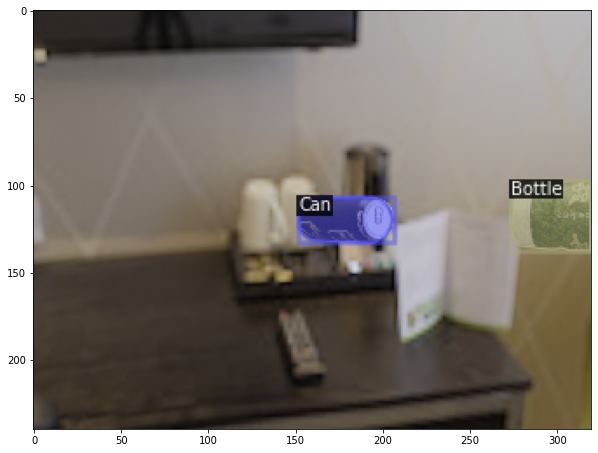

{'file_name': 'output_dataset/train/image.000036.rgb.png', 'height': 480, 'width': 640, 'image_id': 72, 'annotations': [{'iscrowd': False, 'bbox': [309.01, 178.01, 94.98000000000002, 76.98000000000002], 'category_id': 0, 'segmentation': [[396.0, 213.99, 393.01, 212.0, 392.01, 209.0, 392.01, 202.0, 383.0, 193.99, 373.0, 187.99, 370.01, 185.0, 372.0, 183.01, 380.0, 179.01, 382.0, 180.01, 388.0, 178.01, 397.99, 185.0, 403.99, 196.0, 403.99, 204.0, 396.0, 213.99], [329.0, 254.99, 322.0, 251.99, 314.01, 244.0, 309.01, 232.0, 310.01, 223.0, 325.0, 212.01, 326.99, 214.0, 328.99, 230.0, 330.99, 233.0, 330.99, 253.0, 329.0, 254.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': False, 'bbox': [325.01, 155.01, 79.98000000000002, 226.98000000000002], 'category_id': 1, 'segmentation': [[378.0, 381.99, 360.0, 381.99, 348.0, 377.99, 342.01, 372.0, 339.01, 356.0, 339.01, 334.0, 336.01, 323.0, 329.01, 245.0, 330.01, 233.0, 328.01, 230.0, 325.01, 208.0, 345.01, 186.0, 345.01, 184.0, 340.01, 180.0, 

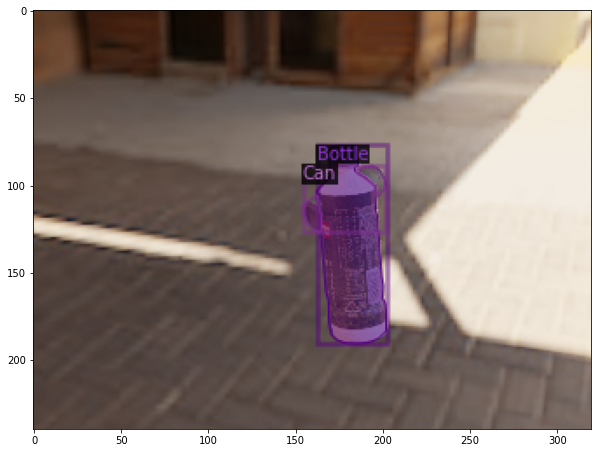

{'file_name': 'output_dataset/train/image.000039.rgb.png', 'height': 480, 'width': 640, 'image_id': 78, 'annotations': [{'iscrowd': False, 'bbox': [275.01, 222.01, 64.98000000000002, 91.98000000000002], 'category_id': 0, 'segmentation': [[304.0, 313.99, 295.0, 313.99, 289.0, 311.99, 281.01, 306.0, 276.01, 297.0, 275.01, 282.0, 298.01, 231.0, 308.0, 223.01, 322.0, 222.01, 332.0, 227.01, 337.99, 234.0, 339.99, 239.0, 339.99, 249.0, 322.99, 300.0, 314.0, 308.99, 304.0, 313.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': False, 'bbox': [632.01, 225.01, 7.980000000000018, 48.98000000000002], 'category_id': 1, 'segmentation': [[639.0, 273.99, 635.0, 272.99, 632.01, 269.0, 633.01, 239.0, 635.01, 228.0, 638.0, 225.01, 639.99, 226.0, 639.0, 273.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}]}


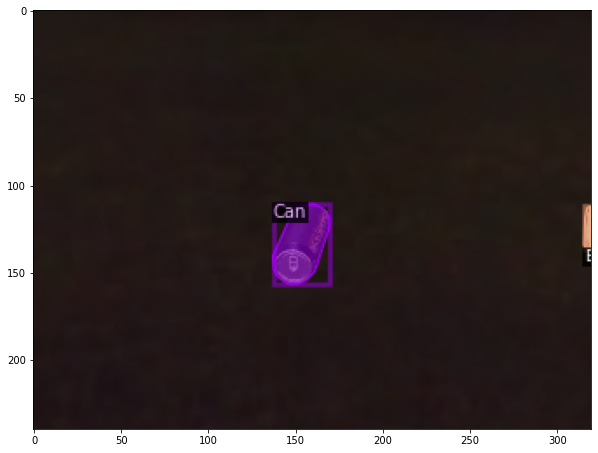

{'file_name': 'output_dataset/train/image.000050.rgb.png', 'height': 480, 'width': 640, 'image_id': 100, 'annotations': [{'iscrowd': False, 'bbox': [305.01, 127.00999999999999, 106.98000000000002, 123.98000000000002], 'category_id': 0, 'segmentation': [[335.0, 250.99, 314.0, 236.99, 305.01, 228.0, 305.01, 219.0, 366.01, 138.0, 371.0, 133.01, 381.0, 127.00999999999999, 401.0, 141.01, 411.99, 151.0, 408.99, 156.0, 407.99, 163.0, 345.99, 245.0, 342.0, 248.99, 337.0, 248.99, 335.0, 250.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': False, 'bbox': [477.01, 280.01, 162.98000000000002, 199.98000000000002], 'category_id': 1, 'segmentation': [[639.0, 479.99, 580.0, 479.99, 545.01, 437.0, 545.01, 435.0, 535.01, 425.0, 522.01, 406.0, 482.01, 359.0, 477.01, 348.0, 478.01, 326.0, 481.01, 315.0, 488.01, 299.0, 498.0, 288.01, 509.0, 283.01, 524.0, 280.01, 549.0, 280.01, 561.0, 284.01, 576.0, 297.01, 609.0, 332.01, 615.0, 336.01, 639.99, 361.0, 639.0, 479.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 

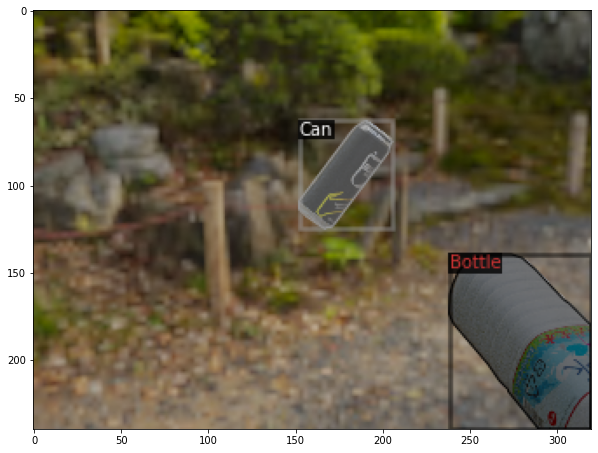

{'file_name': 'output_dataset/train/image.000070.rgb.png', 'height': 480, 'width': 640, 'image_id': 140, 'annotations': [{'iscrowd': False, 'bbox': [285.01, 177.01, 52.98000000000002, 74.98000000000002], 'category_id': 0, 'segmentation': [[320.0, 251.99, 307.0, 250.99, 300.01, 245.0, 285.01, 204.0, 285.01, 193.0, 287.01, 187.0, 296.0, 179.01, 302.0, 177.01, 315.0, 178.01, 324.99, 188.0, 337.99, 230.0, 337.99, 238.0, 334.99, 243.0, 328.0, 248.99, 320.0, 251.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': False, 'bbox': [147.01, 264.01, 216.98000000000002, 65.98000000000002], 'category_id': 1, 'segmentation': [[202.0, 329.99, 194.0, 327.99, 166.0, 326.99, 158.0, 323.99, 152.01, 319.0, 147.01, 305.0, 147.01, 291.0, 152.01, 277.0, 157.0, 272.01, 171.0, 267.01, 192.0, 267.01, 197.0, 265.01, 202.0, 265.01, 206.0, 267.01, 231.0, 267.01, 265.0, 266.01, 268.0, 264.01, 274.0, 264.01, 294.0, 266.01, 314.0, 272.01, 339.0, 286.01, 343.0, 286.01, 345.0, 284.01, 360.0, 284.01, 363.99, 290.0, 3

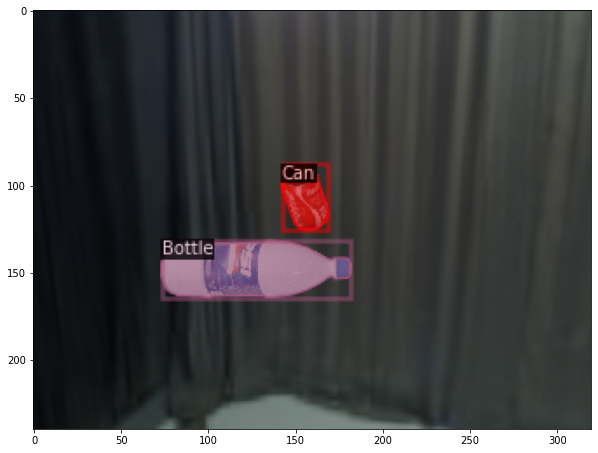

{'file_name': 'output_dataset/train/image.000086.rgb.png', 'height': 480, 'width': 640, 'image_id': 172, 'annotations': [{'iscrowd': False, 'bbox': [260.01, 229.01, 76.98000000000002, 89.98000000000002], 'category_id': 0, 'segmentation': [[292.0, 318.99, 279.0, 314.99, 267.0, 306.99, 261.01, 301.0, 260.01, 295.0, 262.01, 292.0, 262.01, 286.0, 296.01, 233.0, 301.0, 229.01, 312.0, 229.01, 323.0, 234.01, 332.99, 243.0, 336.99, 255.0, 303.99, 309.0, 292.0, 318.99]], 'bbox_mode': <BoxMode.XYWH_ABS: 1>}, {'iscrowd': False, 'bbox': [136.01, 144.01, 151.98000000000002, 169.98000000000002], 'category_id': 1, 'segmentation': [[174.0, 313.99, 164.0, 313.99, 155.0, 310.99, 149.0, 306.99, 140.01, 297.0, 137.01, 290.0, 136.01, 282.0, 138.01, 273.0, 142.01, 265.0, 151.01, 254.0, 155.01, 246.0, 167.01, 235.0, 191.01, 205.0, 196.01, 195.0, 213.0, 179.01, 232.0, 168.01, 243.0, 164.01, 255.0, 162.01, 257.01, 156.0, 269.0, 144.01, 276.0, 144.01, 283.99, 150.0, 287.99, 159.0, 278.99, 172.0, 276.0, 174.99, 

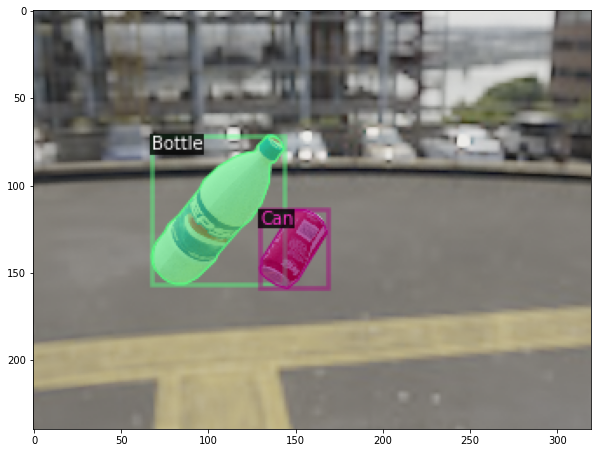

In [9]:
import random
from detectron2.data import DatasetCatalog, MetadataCatalog

dataset_dicts = DatasetCatalog.get("drinks_dataset_train")
metadata = MetadataCatalog.get("drinks_dataset_train")

for d in random.sample(dataset_dicts, 6):
    print(d)
    img = cv2.imread(d["file_name"])
    v = Visualizer(img[:, :, ::-1], metadata=metadata, scale=0.5)
    v = v.draw_dataset_dict(d)
    plt.figure(figsize = (10, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [14]:
#Train model

# Remember to select Runtime --> Change Runtime type --> GPU in colab
from detectron2.engine import DefaultTrainer
from detectron2.config import get_cfg
import os

resume_training = True

cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"))
cfg.DATASETS.TRAIN = ("drinks_dataset_train",)
cfg.DATASETS.TEST = ()
cfg.DATALOADER.NUM_WORKERS = 2
if resume_training:
  cfg.MODEL.WEIGHTS = "output/model_final.pth"
else:
  cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url("COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml")

cfg.SOLVER.IMS_PER_BATCH = 2
cfg.SOLVER.BASE_LR = 0.00025
cfg.SOLVER.MAX_ITER = 1000
cfg.MODEL.ROI_HEADS.NUM_CLASSES = 2 # Number of different labels in the dataset
cfg.SOLVER.CHECKPOINT_PERIOD = 500  # Save

os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)


In [15]:
trainer = DefaultTrainer(cfg) 
if resume_training:
  trainer.resume_or_load(resume=True) 
else:
  trainer.resume_or_load(resume=False) 
force_training = True # False

if not os.path.isfile(os.path.join(cfg.OUTPUT_DIR, "model_final.pth")) or force_training:
  trainer.train()

[11/29 16:34:12 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:06, 26.2MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (3, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (3,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (8, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (8,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to i

[11/29 16:34:24 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride
/usr/local/lib/python3.7/dist-packages/torch/functional.py:445: UserWarning: torch.meshgrid: in an upcoming release, it will be required to pass the indexing argument. (Triggered internally at  ../aten/src/ATen/native/TensorShape.cpp:2157.)
  return _VF.meshgrid(tensors, **kwargs)  # type: ignore[attr-defined]


[11/29 16:34:53 d2.utils.events]:  eta: 0:23:29  iter: 19  total_loss: 2.158  loss_cls: 1.171  loss_box_reg: 0.2777  loss_mask: 0.6951  loss_rpn_cls: 0.002665  loss_rpn_loc: 0.00269  time: 1.4530  data_time: 0.0231  lr: 4.9953e-06  max_mem: 2510M
[11/29 16:35:22 d2.utils.events]:  eta: 0:23:09  iter: 39  total_loss: 1.98  loss_cls: 1.036  loss_box_reg: 0.2828  loss_mask: 0.6805  loss_rpn_cls: 0.002011  loss_rpn_loc: 0.003466  time: 1.4367  data_time: 0.0082  lr: 9.9902e-06  max_mem: 2510M
[11/29 16:35:51 d2.utils.events]:  eta: 0:22:42  iter: 59  total_loss: 1.743  loss_cls: 0.7911  loss_box_reg: 0.3022  loss_mask: 0.6468  loss_rpn_cls: 0.00245  loss_rpn_loc: 0.003033  time: 1.4345  data_time: 0.0091  lr: 1.4985e-05  max_mem: 2510M
[11/29 16:36:18 d2.utils.events]:  eta: 0:22:09  iter: 79  total_loss: 1.414  loss_cls: 0.5137  loss_box_reg: 0.2714  loss_mask: 0.5987  loss_rpn_cls: 0.003004  loss_rpn_loc: 0.002756  time: 1.4235  data_time: 0.0097  lr: 1.998e-05  max_mem: 2510M
[11/29 16:

In [16]:
#Use model for inference
#Now, we can perform inference on our validation set by creating a predictor object.

cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.5 
cfg.DATASETS.TEST = ("drinks_dataset_test", )
predictor = DefaultPredictor(cfg)

WARNING [11/29 16:58:45 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/29 16:58:45 d2.data.datasets.coco]: Loaded 100 images in COCO format from output_dataset/train/_annotations.coco.json


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


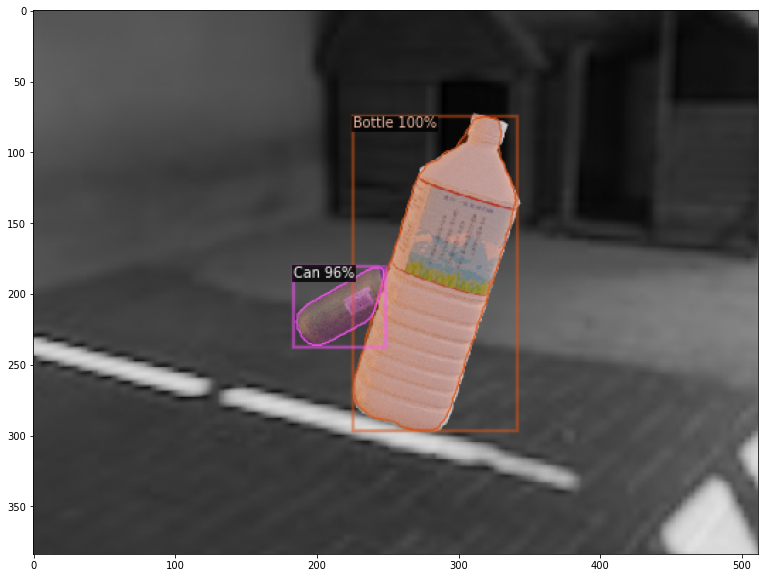

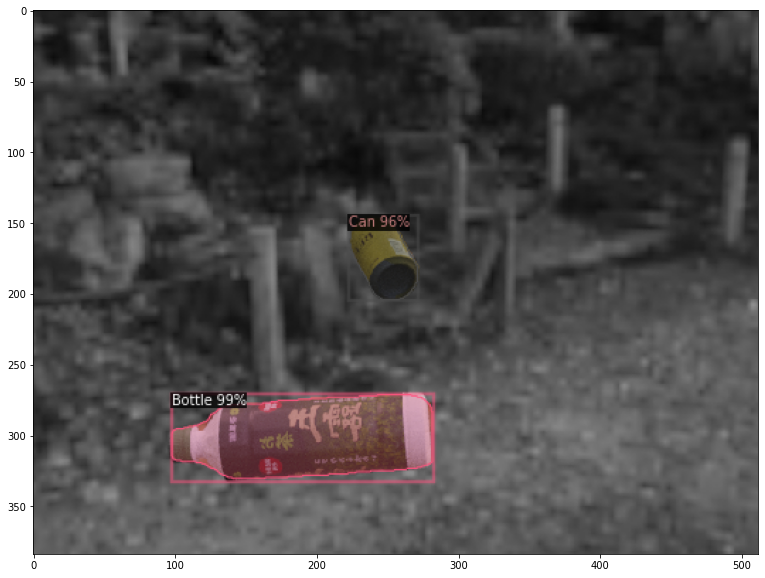

In [17]:
from detectron2.utils.visualizer import ColorMode
dataset_dicts = DatasetCatalog.get("drinks_dataset_train")

for d in random.sample(dataset_dicts, 6):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [18]:
# Evaluate accuracy on train set
from detectron2.evaluation import COCOEvaluator, inference_on_dataset
from detectron2.data import build_detection_test_loader

evaluator = COCOEvaluator("drinks_dataset_train", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "drinks_dataset_train")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [11/29 16:58:47 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/29 16:58:47 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/29 16:58:47 d2.data.datasets.coco]: Loaded 100 images in COCO format from output_dataset/train/_annotations.coco.json
[11/29 16:58:47 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/29 16:58:47 d2.data.common]: Serializing 100 elements to byte tensors and concatenating them all ...
[11/29 16:58:47 d2.data.common]: Serialized dataset takes 0.10 MiB
[11/29 16:58:47 d2.evaluation.evaluator]: Start inference on 100 batches


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[11/29 16:58:51 d2.evaluation.evaluator]: Inference done 11/100. Dataloading: 0.0017 s/iter. Inference: 0.3467 s/iter. Eval: 0.0039 s/iter. Total: 0.3523 s/iter. ETA=0:00:31
[11/29 16:58:57 d2.evaluation.evaluator]: Inference done 26/100. Dataloading: 0.0023 s/iter. Inference: 0.3453 s/iter. Eval: 0.0040 s/iter. Total: 0.3517 s/iter. ETA=0:00:26
[11/29 16:59:02 d2.evaluation.evaluator]: Inference done 41/100. Dataloading: 0.0021 s/iter. Inference: 0.3451 s/iter. Eval: 0.0041 s/iter. Total: 0.3516 s/iter. ETA=0:00:20
[11/29 16:59:07 d2.evaluation.evaluator]: Inference done 56/100. Dataloading: 0.0023 s/iter. Inference: 0.3446 s/iter. Eval: 0.0040 s/iter. Total: 0.3512 s/iter. ETA=0:00:15
[11/29 16:59:12 d2.evaluation.evaluator]: Inference done 71/100. Dataloading: 0.0024 s/iter. Inference: 0.3449 s/iter. Eval: 0.0039 s/iter. Total: 0.3514 s/iter. ETA=0:00:10
[11/29 16:59:18 d2.evaluation.evaluator]: Inference done 86/100. Dataloading: 0.0024 s/iter. Inference: 0.3448 s/iter. Eval: 0.003

In [19]:
# Evaluate accuracy on test (aka validation) set

evaluator = COCOEvaluator("drinks_dataset_test", cfg, False, output_dir="./output/")
val_loader = build_detection_test_loader(cfg, "drinks_dataset_test")
print(inference_on_dataset(trainer.model, val_loader, evaluator))

WARNING [11/29 16:59:23 d2.evaluation.coco_evaluation]: COCO Evaluator instantiated using config, this is deprecated behavior. Please pass in explicit arguments instead.
WARNING [11/29 16:59:23 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/29 16:59:23 d2.data.datasets.coco]: Loaded 10 images in COCO format from output_dataset/test/_annotations.coco.json
[11/29 16:59:23 d2.data.build]: Distribution of instances among all 2 categories:
|  category  | #instances   |  category  | #instances   |
|:----------:|:-------------|:----------:|:-------------|
|    Can     | 10           |   Bottle   | 10           |
|            |              |            |              |
|   total    | 20           |            |              |
[11/29 16:59:23 d2.data.dataset_mapper]: [DatasetMapper] Augmentations used in inference: [ResizeShortestEdge(short_edge_length=(800, 800), max_size=1333, sample_style='choice')]
[11/29 16:59:23 d2.da

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


[11/29 16:59:27 d2.evaluation.evaluator]: Total inference time: 0:00:01.793973 (0.358795 s / iter per device, on 1 devices)
[11/29 16:59:27 d2.evaluation.evaluator]: Total inference pure compute time: 0:00:01 (0.343057 s / iter per device, on 1 devices)
[11/29 16:59:27 d2.evaluation.coco_evaluation]: Preparing results for COCO format ...
[11/29 16:59:27 d2.evaluation.coco_evaluation]: Saving results to ./output/coco_instances_results.json
[11/29 16:59:27 d2.evaluation.coco_evaluation]: Evaluating predictions with unofficial COCO API...
Loading and preparing results...
DONE (t=0.00s)
creating index...
index created!
[11/29 16:59:27 d2.evaluation.fast_eval_api]: Evaluate annotation type *bbox*
[11/29 16:59:27 d2.evaluation.fast_eval_api]: COCOeval_opt.evaluate() finished in 0.01 seconds.
[11/29 16:59:27 d2.evaluation.fast_eval_api]: Accumulating evaluation results...
[11/29 16:59:27 d2.evaluation.fast_eval_api]: COCOeval_opt.accumulate() finished in 0.01 seconds.
 Average Precision  (AP)

WARNING [11/29 16:59:59 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[11/29 16:59:59 d2.data.datasets.coco]: Loaded 10 images in COCO format from output_dataset/test/_annotations.coco.json


/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


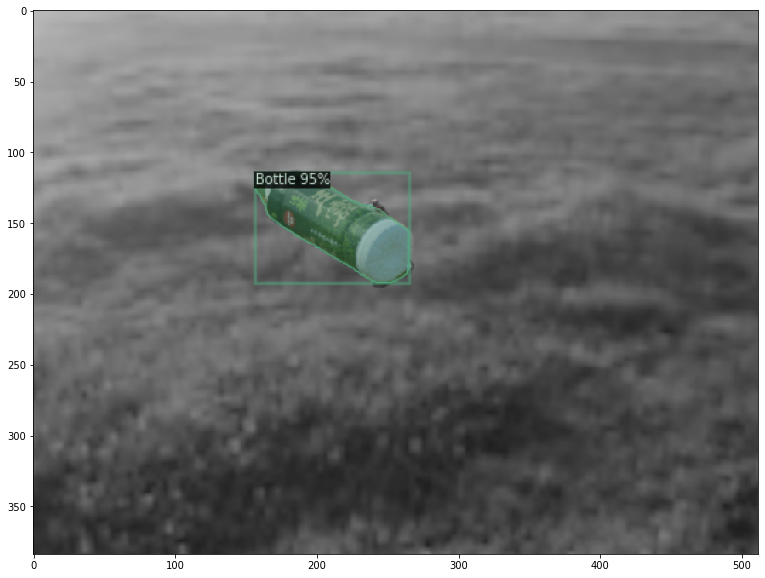

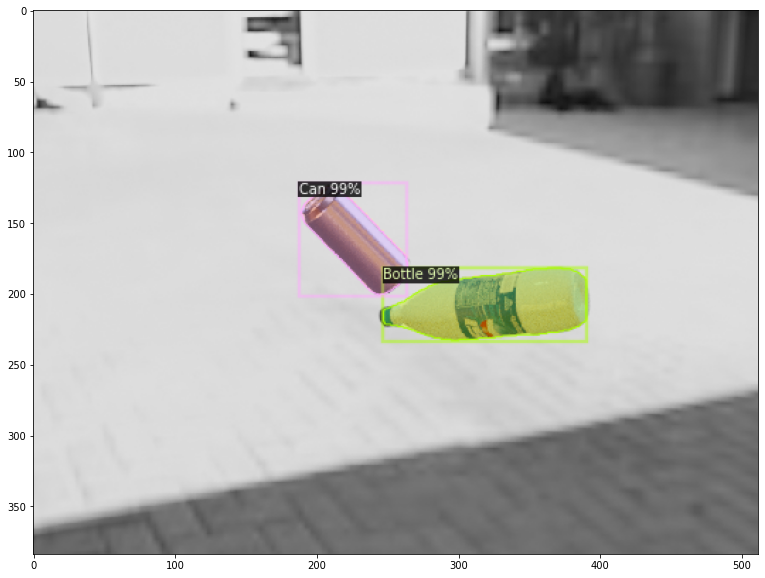

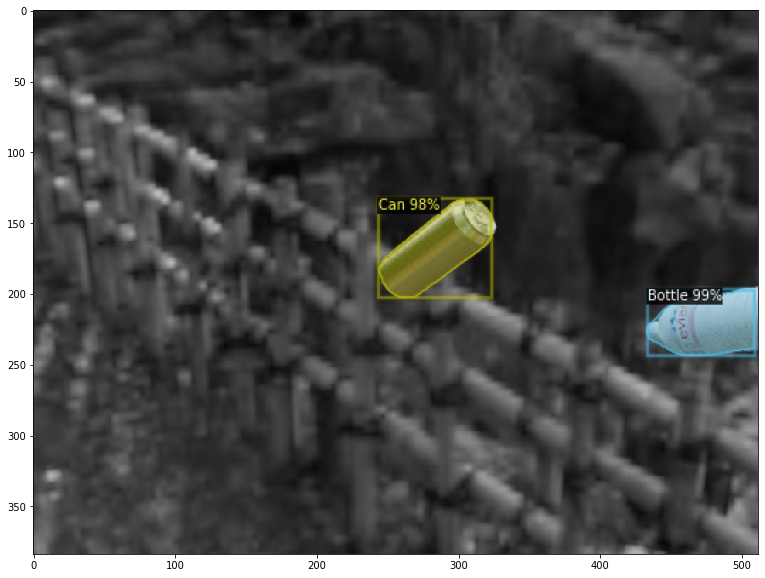

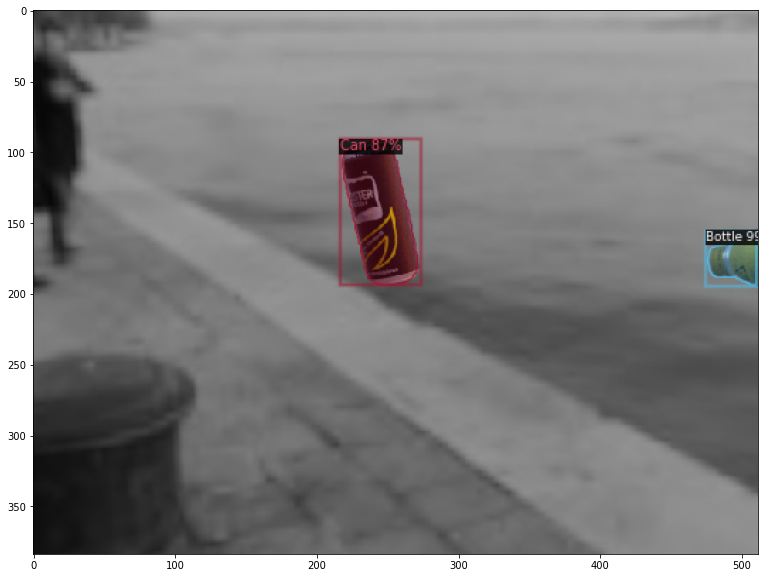

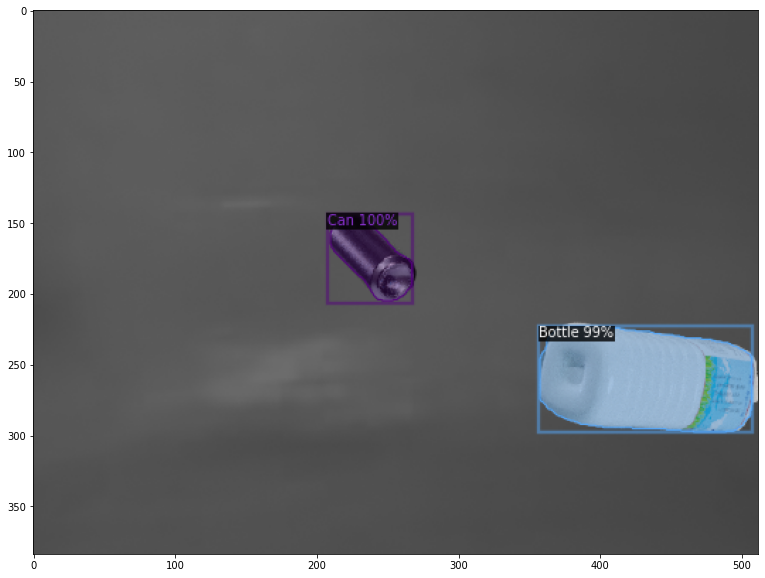

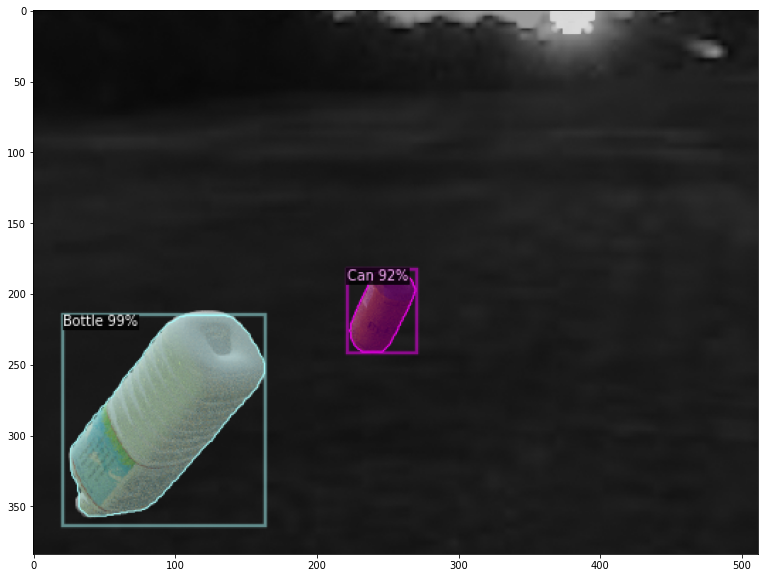

In [24]:
dataset_dicts = DatasetCatalog.get("drinks_dataset_test")

for d in random.sample(dataset_dicts, 6):    
    im = cv2.imread(d["file_name"])
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

In [20]:
# Load test images

In [21]:
!unzip target_images.zip 

Archive:  target_images.zip
   creating: target_images/
  inflating: target_images/002.png   
   creating: __MACOSX/
   creating: __MACOSX/target_images/
  inflating: __MACOSX/target_images/._002.png  
  inflating: target_images/003.png   
  inflating: __MACOSX/target_images/._003.png  
  inflating: target_images/001.png   
  inflating: __MACOSX/target_images/._001.png  
  inflating: target_images/010.png   
  inflating: __MACOSX/target_images/._010.png  
  inflating: target_images/004.png   
  inflating: __MACOSX/target_images/._004.png  
  inflating: target_images/005.png   
  inflating: __MACOSX/target_images/._005.png  
  inflating: target_images/007.png   
  inflating: __MACOSX/target_images/._007.png  
  inflating: target_images/006.png   
  inflating: __MACOSX/target_images/._006.png  
  inflating: target_images/008.png   
  inflating: __MACOSX/target_images/._008.png  
  inflating: target_images/009.png   
  inflating: __MACOSX/target_images/._009.png  
  inflating: __MACOSX/._

/usr/local/lib/python3.7/dist-packages/detectron2/structures/image_list.py:88: UserWarning: __floordiv__ is deprecated, and its behavior will change in a future version of pytorch. It currently rounds toward 0 (like the 'trunc' function NOT 'floor'). This results in incorrect rounding for negative values. To keep the current behavior, use torch.div(a, b, rounding_mode='trunc'), or for actual floor division, use torch.div(a, b, rounding_mode='floor').
  max_size = (max_size + (stride - 1)) // stride * stride


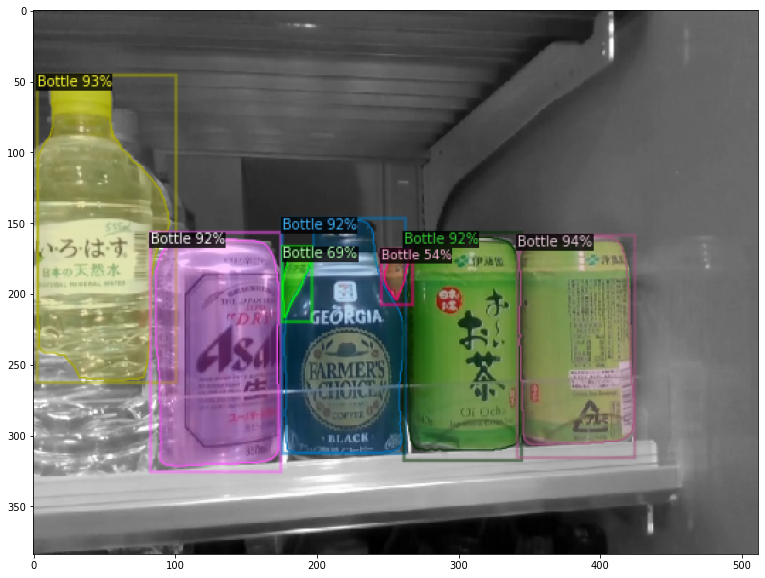

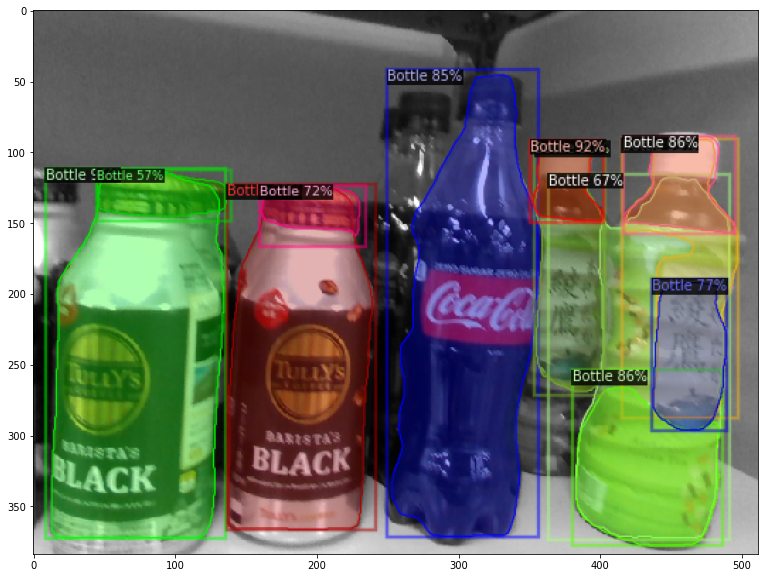

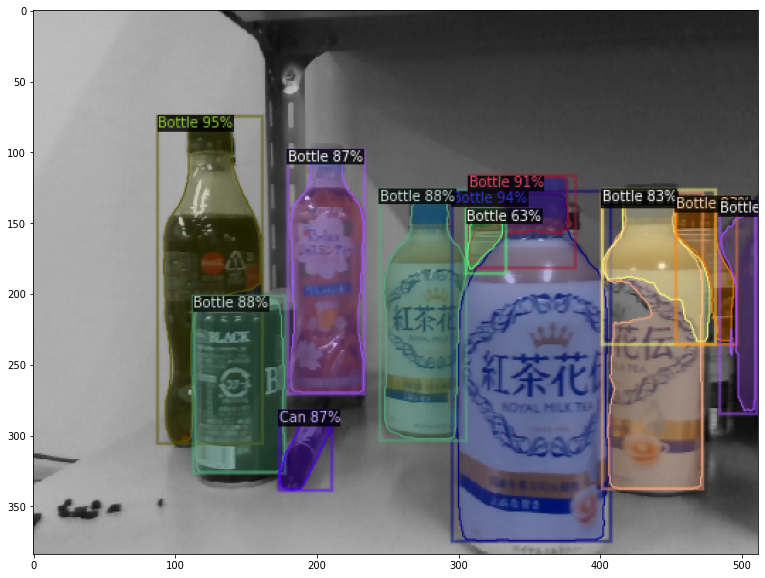

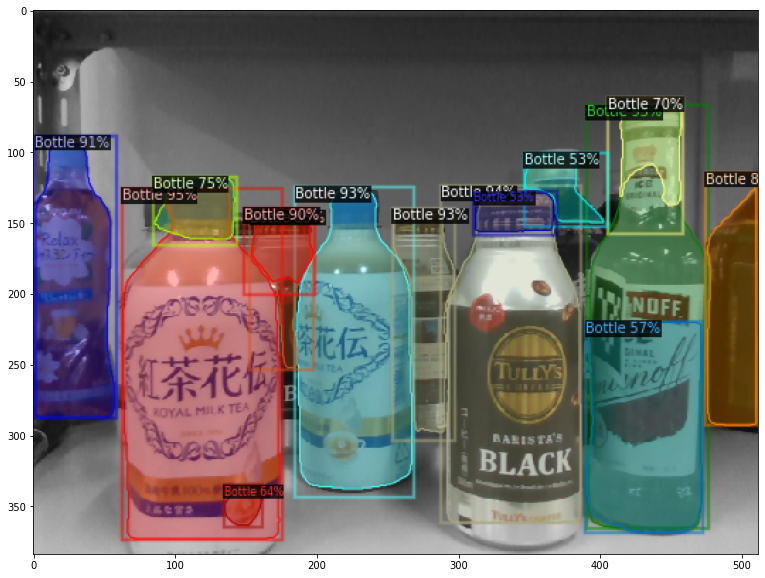

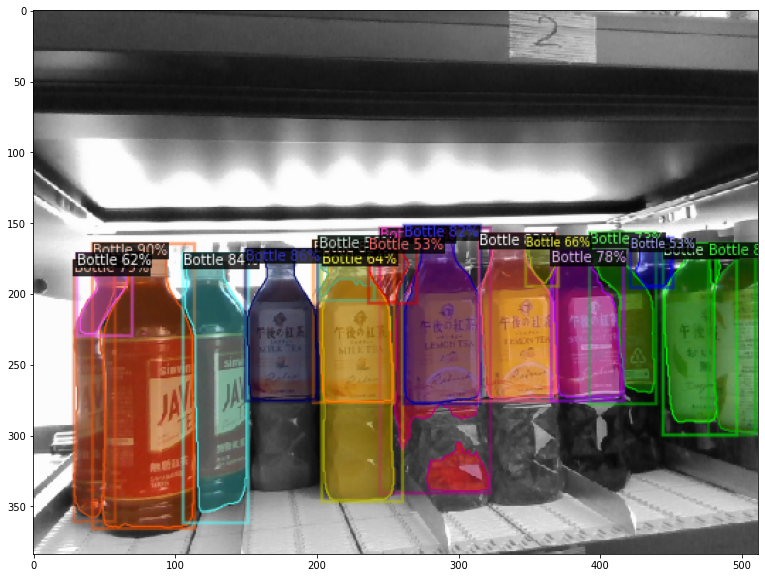

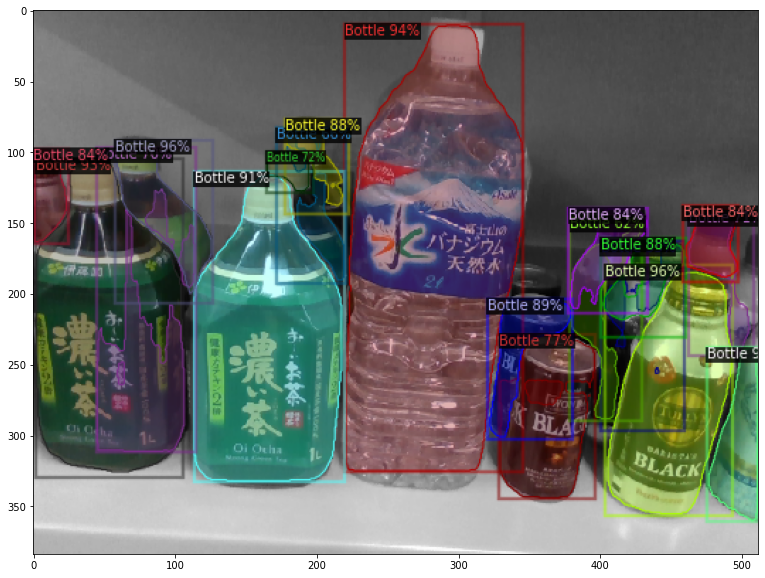

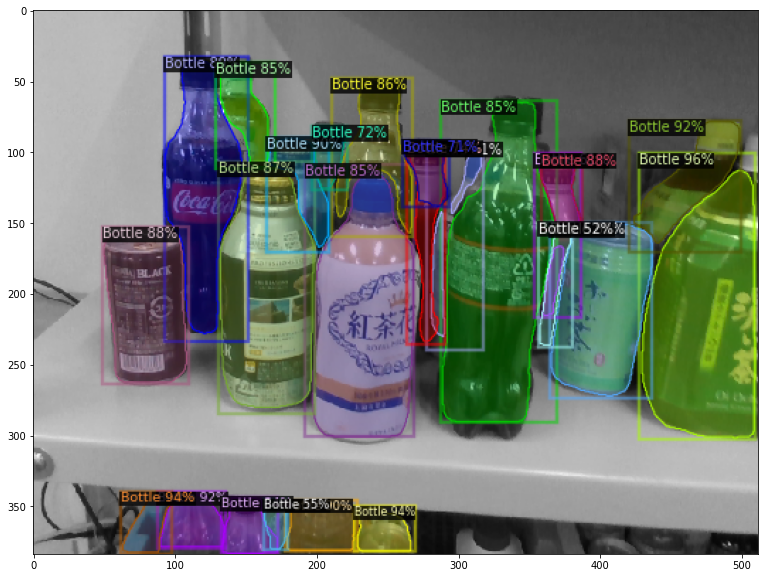

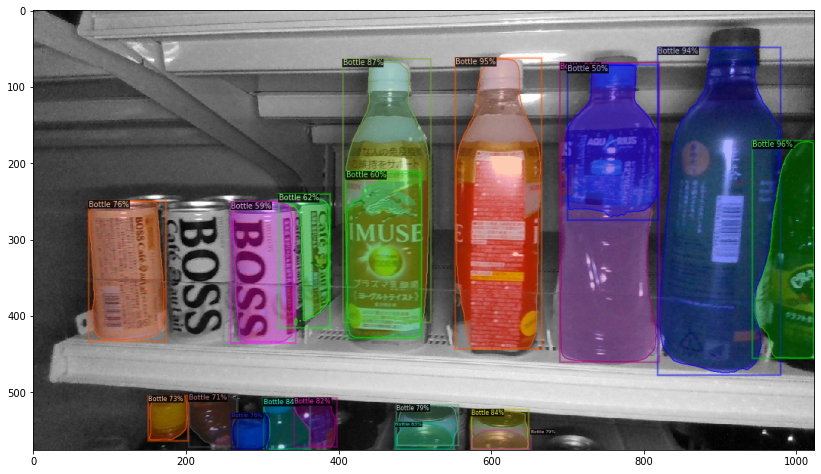

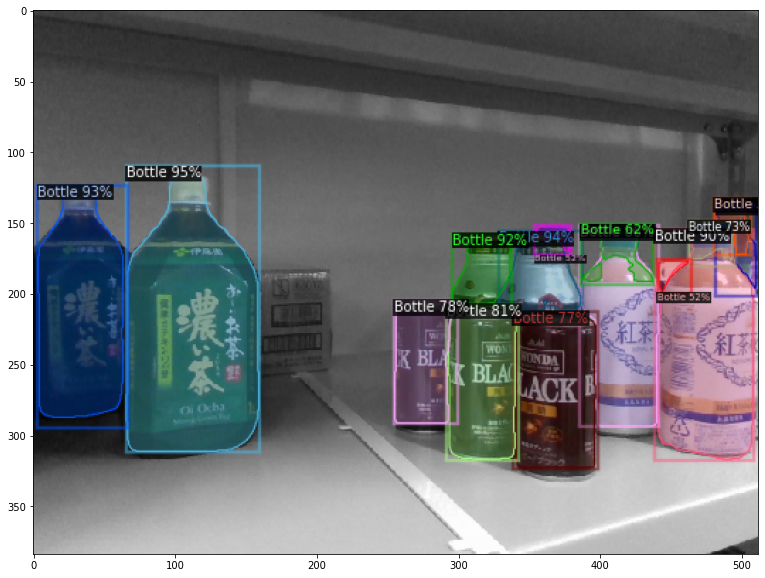

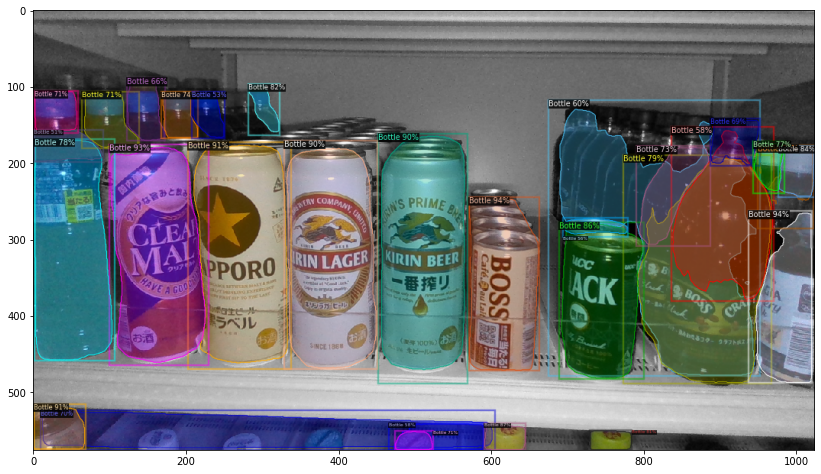

In [22]:
# Show predictions on unseen (test) images
test_path = "./target_images/"
for image in os.listdir(test_path):    
    im = cv2.imread(test_path +  image)
    outputs = predictor(im)
    v = Visualizer(im[:, :, ::-1],
                   metadata=metadata, 
                   scale=0.8, 
                   instance_mode=ColorMode.IMAGE_BW   # remove the colors of unsegmented pixels
    )
    v = v.draw_instance_predictions(outputs["instances"].to("cpu"))
    plt.figure(figsize = (14, 10))
    plt.imshow(cv2.cvtColor(v.get_image()[:, :, ::-1], cv2.COLOR_BGR2RGB))
    plt.show()

002.png


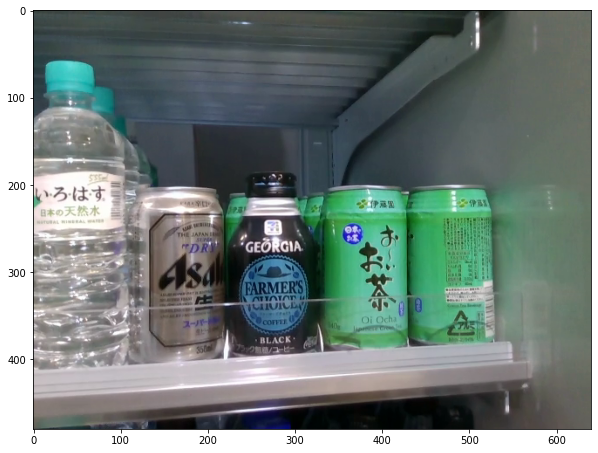

009.png


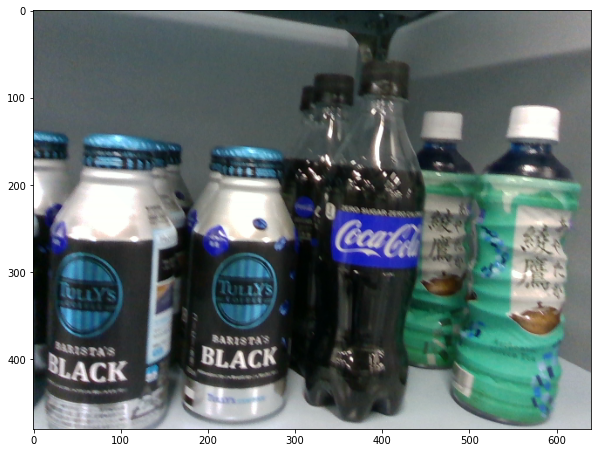

001.png


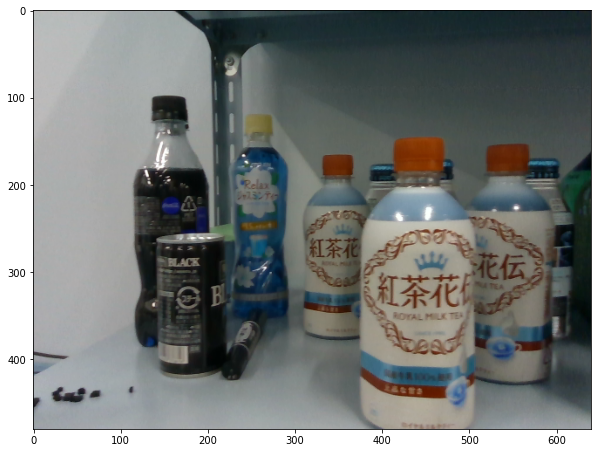

004.png


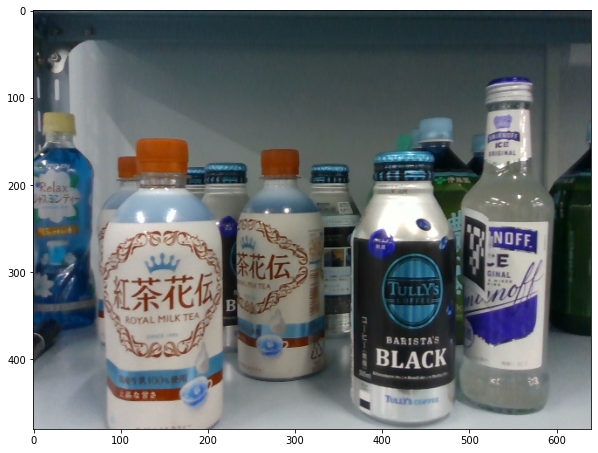

010.png


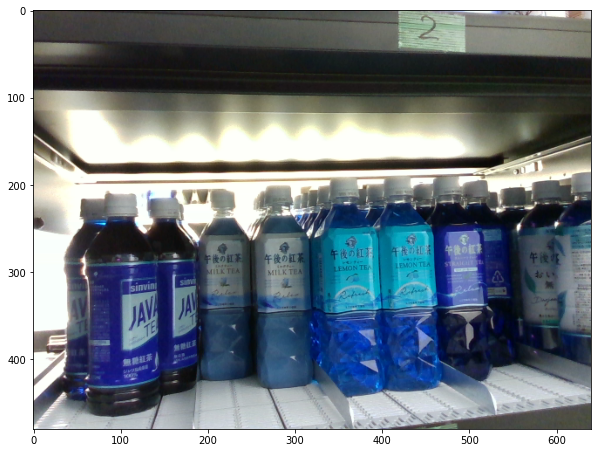

008.png


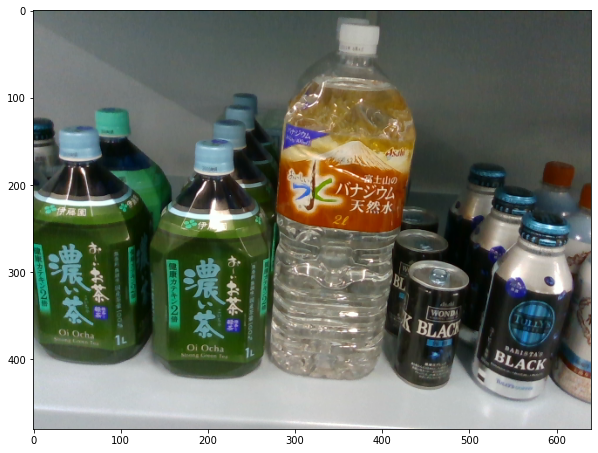

007.png


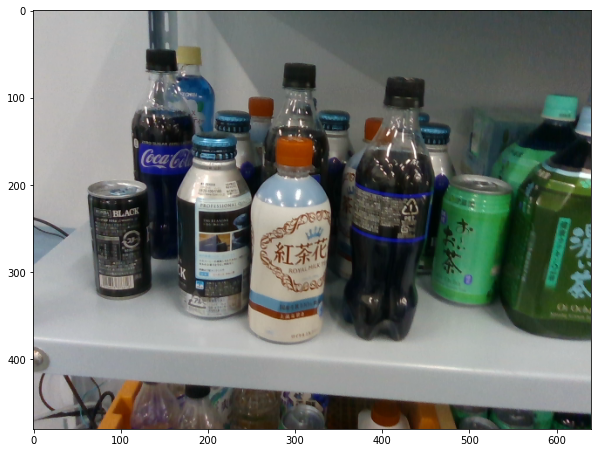

003.png


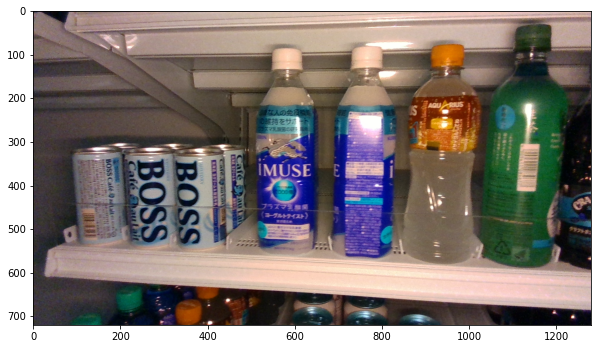

006.png


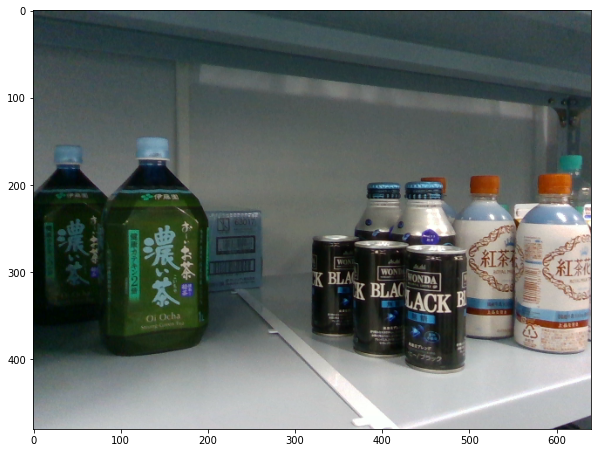

005.png


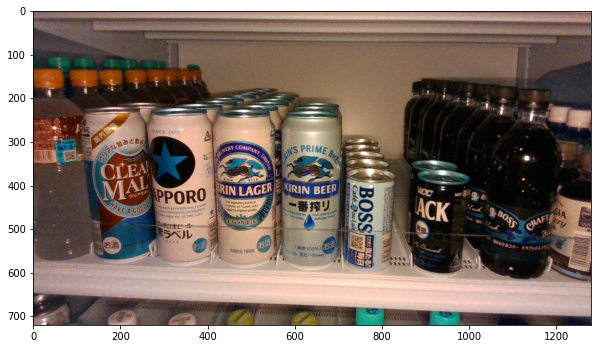

In [32]:
'''test_path = "./target_images/"
for image in os.listdir(test_path):
    print(image)
    img = cv2.imread(test_path +  image)
    plt.figure(figsize = (10, 10))
    plt.imshow(img)
    plt.show() 
'''

In [ ]:
# Load the TensorBoard notebook extension
%load_ext tensorboard

In [ ]:
tensorboard_path = "./output"
#!kill -9 341
%tensorboard --logdir $tensorboard_path